**gray_image_histogram.py**

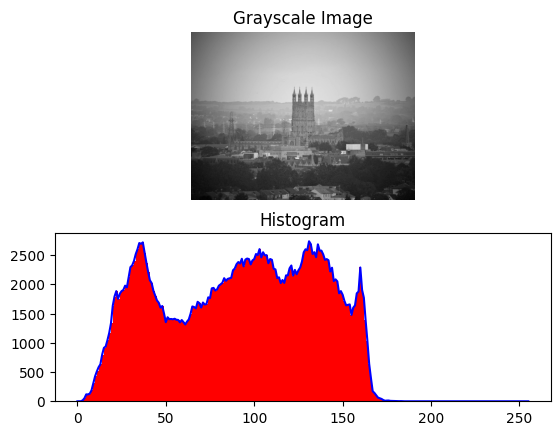

In [3]:
import cv2 as cv
import matplotlib.pyplot as plt

# read the image as grayscale
img = cv.imread("./img/city_lowcontrast.jpg", cv.IMREAD_GRAYSCALE)

# calculate histogram of the image
img_hist = cv.calcHist([img], [0], None, [256], [0, 256])

# display the histogram
# plt.figure(figsize=(10,8))
plt.subplot(2, 1, 1)
plt.imshow(img, cmap='gray')
plt.title("Grayscale Image")
plt.axis("off")

plt.subplot(2, 1, 2)
plt.plot(img_hist, color='b')
plt.hist(img.flatten(), 256, [0, 255], color='r')
plt.title("Histogram")
plt.show()



**image_negative.py**

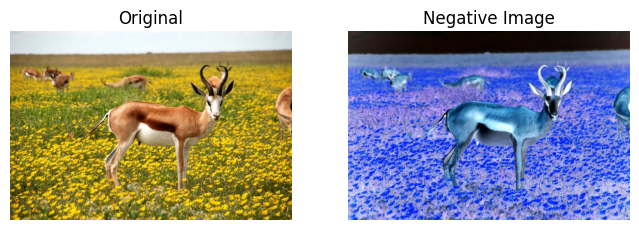

In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/antelops.jpeg")

# calculate the negative image
img_negative = cv.bitwise_not(img)

# display the resultant image
plt.figure(figsize=(8,6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(img_negative, cv.COLOR_BGR2RGB))
plt.title("Negative Image")
plt.axis("off")

plt.show()

**image_log_transform.py**

C:\Users\user\AppData\Local\Temp\ipykernel_6208\385620068.py:10: RuntimeWarning: divide by zero encountered in log
  img_log = c * np.log(1 + img)
C:\Users\user\AppData\Local\Temp\ipykernel_6208\385620068.py:11: RuntimeWarning: invalid value encountered in cast
  img_log = np.array(img_log, dtype=np.uint8)


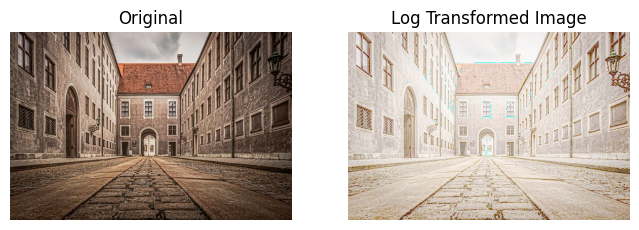

In [3]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/house.png")

# applying log transform
c = 255 / (np.log(1 + np.max(img))) 
img_log = c * np.log(1 + img) 
img_log = np.array(img_log, dtype=np.uint8)

# display the image
plt.figure(figsize=(8,6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(img_log, cv.COLOR_BGR2RGB))
plt.title("Log Transformed Image")
plt.axis("off")

plt.show()

**gamma_transform.py**

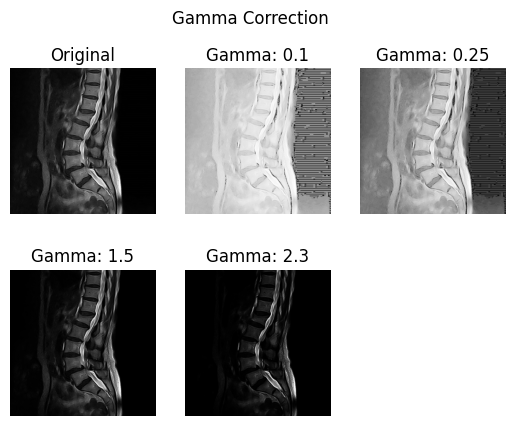

In [4]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/mri_bone.jpg")

# apply power law (gamma) transform
gamma_vals = [0.1, 0.25, 1.5, 2.3]
img_results = [img]
img_results_titles = ["Original"]
for gamma in gamma_vals:
    img_gamma_corrected = np.array(255 * (img / 255) ** gamma, dtype=np.uint8)
    img_results.append(img_gamma_corrected)
    img_results_titles.append(f"Gamma: {gamma}")

# display the corrected images
fig, ax = plt.subplots(2, 3)
fig.suptitle("Gamma Correction")
k = 0
for i in range(2):
    for j in range(3):
        if i == 1 and j == 2:
            ax[i,j].axis("off")
            break
        ax[i,j].axis("off")
        ax[i,j].imshow(cv.cvtColor(img_results[k], cv.COLOR_BGR2RGB))
        ax[i,j].set_title(img_results_titles[k])
        k += 1
plt.show()

**piecewise_linear_transform.py**

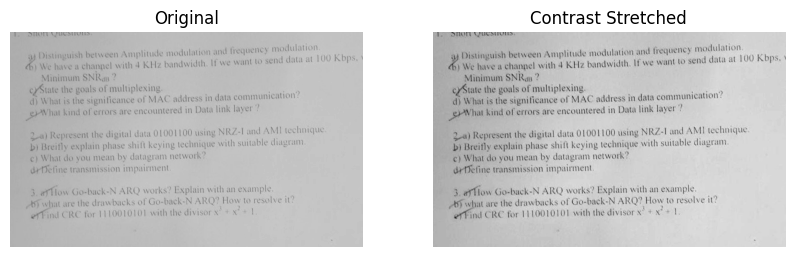

In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import NoNorm

# function for contrast stretching
def img_contrast_stretch(img, r_max, r_min, I_max, I_min):
    h, c = img.shape
    ratio = (((I_max - I_min) / (r_max - r_min)) + I_min)
    dst = np.zeros((h, c), dtype=np.uint8)
    for i in range(h):
        for j in range(c):
            dst[i,j] = ((img[i,j] - r_min) * ratio)

    return dst
    
# read the image
img = cv.imread("./img/low_contrast_qp.jpg", cv.IMREAD_GRAYSCALE)

# apply piecewise linear transform i.e contrat stretching
max_px, min_px = img.max(), img.min()
img_contrast_stretched = img_contrast_stretch(img, max_px, min_px, 255, 0)

# display the output image
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray', norm=NoNorm())
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_contrast_stretched, cmap='gray', norm=NoNorm())
plt.title("Contrast Stretched")
plt.axis("off")

plt.show()

**histogram_equalization.py**

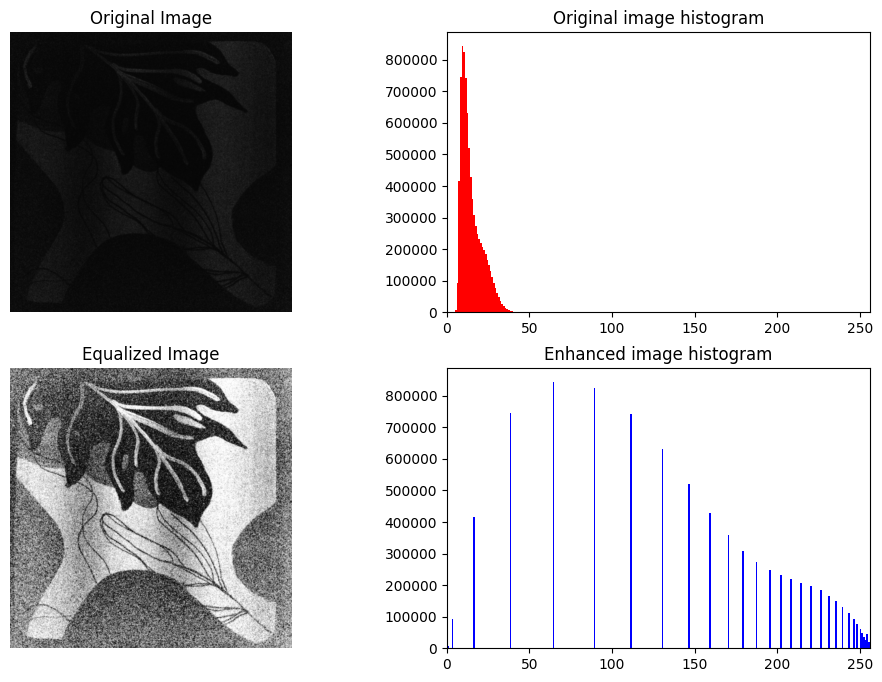

In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import NoNorm

# read the image
img = cv.imread("./img/color_lowcontrast.jpg", cv.IMREAD_GRAYSCALE)

# calculate histogram of the image
hist = cv.calcHist([img], [0], None, [256], [0,256])

# equalizing the histogram
img_eq = cv.equalizeHist(img)

# displaying the result
plt.figure(figsize=(12,8))
plt.subplot(2, 2, 1)
plt.imshow(img, cmap='gray', norm=NoNorm())
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.hist(img.flatten(), 256, [0,256],color='r')
plt.xlim([0,256])
plt.title("Original image histogram")

plt.subplot(2, 2, 3)
plt.imshow(img_eq, cmap='gray', norm=NoNorm())
plt.title("Equalized Image")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.hist(img_eq.flatten(), 256, [0,256],color='b')
plt.xlim([0,256])
plt.title("Enhanced image histogram")

plt.show()

**brightness_enhancement.py**

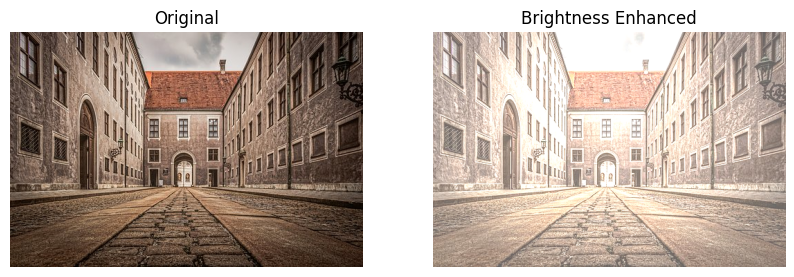

In [7]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/house.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# apply brightness enhancement
res_img = cv.convertScaleAbs(img, alpha=1, beta=100)

# display the output
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(res_img)
plt.title("Brightness Enhanced")
plt.axis("off")

plt.show()

**brightness_suppression.py**

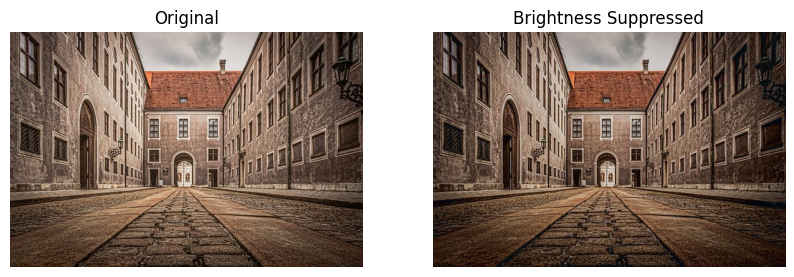

In [10]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/house.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# apply brightness suppression
res_img = cv.convertScaleAbs(img, alpha=1, beta=-20)

# display the output
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(res_img)
plt.title("Brightness Suppressed")
plt.axis("off")

plt.show()

**contrast_manipulation.py**

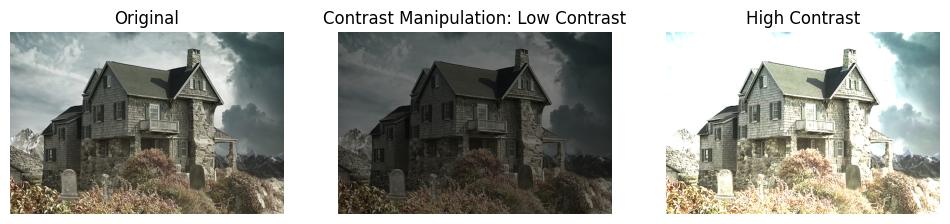

In [16]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/house2.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# apply contrast manipulation
alpha1 = 0.5
alpha2 = 2
img_low_contrast = cv.convertScaleAbs(img, alpha=alpha1, beta=0)
img_high_contrast = cv.convertScaleAbs(img, alpha=alpha2, beta=0)

# display the output
plt.figure(figsize=(12,10))
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(img_low_contrast)
plt.title("Contrast Manipulation: Low Contrast")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(img_high_contrast)
plt.title("High Contrast")
plt.axis("off")

plt.show()

**gray_level_slicing.py**

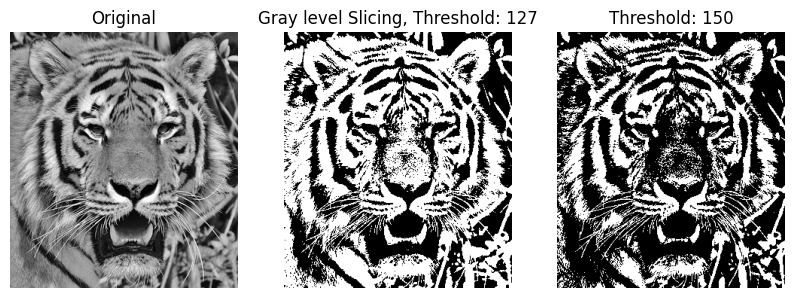

In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import NoNorm

# function for gray level slicing without background
def gray_level_slicing(img, T=127):
    r, c= img.shape
    L = 255  # Highest intensity value for 8 bit image
    img_thresh = np.zeros((r, c), dtype=np.uint8)
    for i in range(r):
        for j in range(c):
            if img[i,j] < T:
                img_thresh[i,j] = 0
            else:
                img_thresh[i,j] = L
    return img_thresh
    
# read the image
img = cv.imread("./img/tiger3.jpg", cv.IMREAD_GRAYSCALE)

# apply contrast manipulation
img_res1 = gray_level_slicing(img)
img_res2 = gray_level_slicing(img, 150)

# display the output
plt.figure(figsize=(10,8))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray', norm=NoNorm())
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(img_res1, cmap='gray', norm=NoNorm())
plt.title("Gray level Slicing, Threshold: 127")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(img_res2, cmap='gray', norm=NoNorm())
plt.title("Threshold: 150")
plt.axis("off")

plt.show()

**img_addition.py**

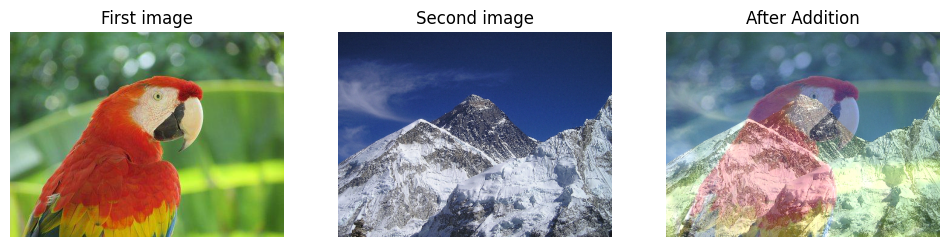

In [15]:
import cv2 as cv
import matplotlib.pyplot as plt

# read the image of same size
img1 = cv.imread("./img/parrot.png")
img2 = cv.imread("./img/hill_resized.png")

# adding images
img_res = cv.addWeighted(img1, 0.5, img2, 0.8, 0)

# display the added image
plt.figure(figsize=(12,8))
plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
plt.title("First image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))
plt.title("Second image")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(img_res, cv.COLOR_BGR2RGB))
plt.title("After Addition")
plt.axis("off")

plt.show()

**img_subtraction.py**

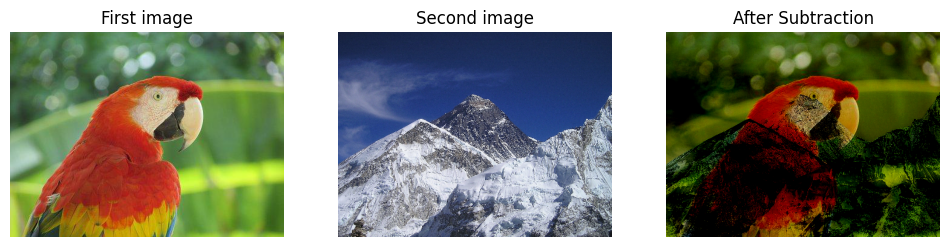

In [10]:
import cv2 as cv
import matplotlib.pyplot as plt

# read the image of same size
img1 = cv.imread("./img/parrot.png")
img2 = cv.imread("./img/hill_resized.png")

# adding images
img_res = cv.subtract(img1, img2)

# display the added image
plt.figure(figsize=(12,8))
plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
plt.title("First image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))
plt.title("Second image")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(img_res, cv.COLOR_BGR2RGB))
plt.title("After Subtraction")
plt.axis("off")

plt.show()

**image_multiplication.py**

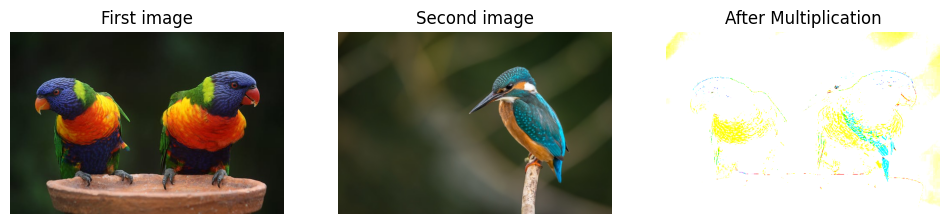

In [4]:
import cv2 as cv
import matplotlib.pyplot as plt

# read the image of same size
img1 = cv.imread("./img/birds.jpg")
img2 = cv.imread("./img/orange_bird.jpg")

# adding images
img_res = cv.multiply(img1, img2)

# display the added image
plt.figure(figsize=(12,8))
plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
plt.title("First image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))
plt.title("Second image")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(img_res, cv.COLOR_BGR2RGB))
plt.title("After Multiplication")
plt.axis("off")

plt.show()

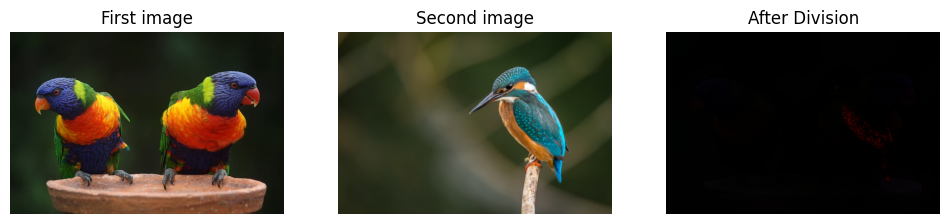

In [5]:
import cv2 as cv
import matplotlib.pyplot as plt

# read the image of same size
img1 = cv.imread("./img/birds.jpg")
img2 = cv.imread("./img/orange_bird.jpg")

# adding images
img_res = cv.divide(img1, img2)

# display the added image
plt.figure(figsize=(12,8))
plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
plt.title("First image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))
plt.title("Second image")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(img_res, cv.COLOR_BGR2RGB))
plt.title("After Division")
plt.axis("off")

plt.show()

**salt_pepper_noise.py**

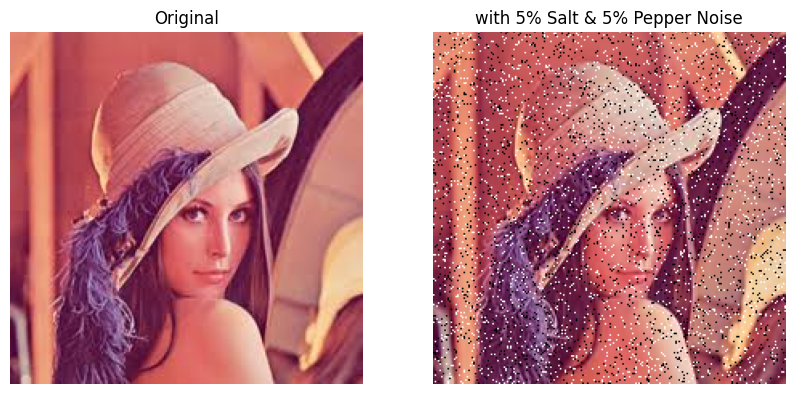

In [17]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/lena.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# adding 5 % salt & 5 % pepper noise
noise_ratio = 0.1   # total 10% of noise in image
noisy_img = img.copy()
h, w, ch = noisy_img.shape
noisy_pixels = int(h * w * noise_ratio)

for _ in range(noisy_pixels):
    row, col = np.random.randint(0, h), np.random.randint(0, w)
    if np.random.rand() < 0.5:
        noisy_img[row, col] = [0, 0, 0]
    else:
        noisy_img[row, col] = [255, 255, 255]

# display the resultant image
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(noisy_img)
plt.title("with 5% Salt & 5% Pepper Noise")
plt.axis("off")

plt.show()

**gaussian_noise.py**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


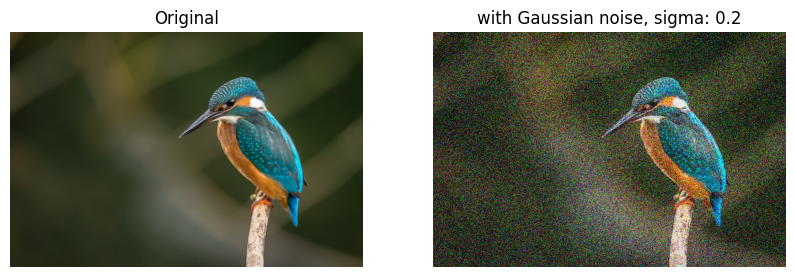

In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/orange_bird.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img = img/255
h, c, ch = img.shape

# generating gaussian noise
mean, sigma = 0, 0.2
gauss_noise = np.random.normal(loc=mean, scale=sigma, size=(h, c, ch))

# adding generated noise to the image
img_noisy = img + gauss_noise

# display the noisy image
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_noisy)
plt.title("with Gaussian noise, sigma: 0.2")
plt.axis("off")

plt.show()

**mean_filter.py**

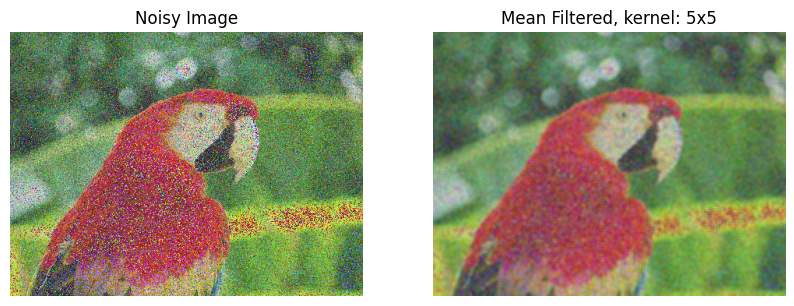

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/noisyParrot.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# apply mean filter of kernel 5x5
img_mean_filtered = cv.blur(img, (5, 5))

# display the filtered image
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Noisy Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_mean_filtered)
plt.title("Mean Filtered, kernel: 5x5")
plt.axis("off")

plt.show()

**weighted_avg_filter.py**

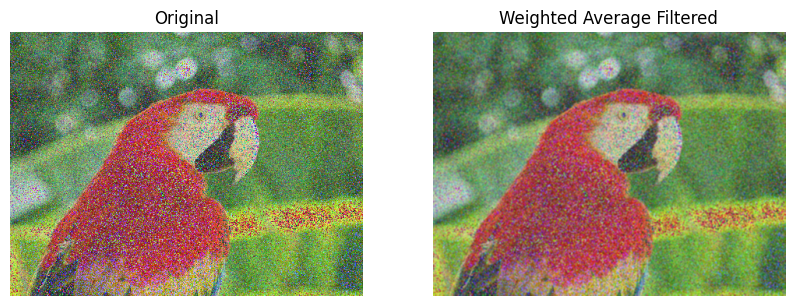

In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/noisyParrot.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# defining kernel for the weighted average filter
wt_kernel = np.array([[1,2,1], [2,4,2], [1,2,1]])/16

# Apply the weighted average filter
filtered_img = cv.filter2D(src=img, ddepth=-1, kernel=wt_kernel)

plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(filtered_img)
plt.title("Weighted Average Filtered")
plt.axis("off")

plt.show()

**median_filter.py**

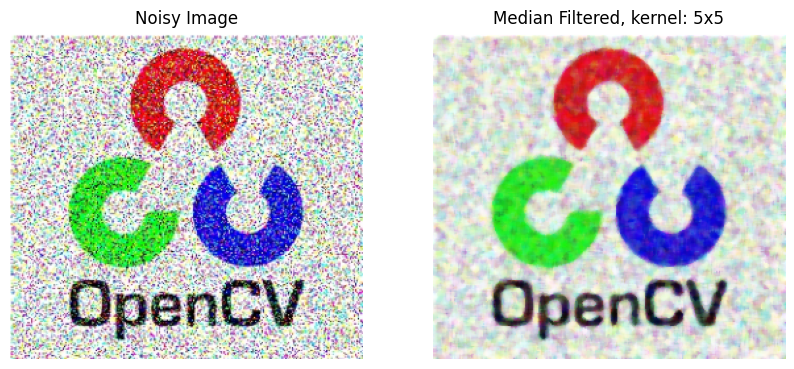

In [7]:
import cv2 as cv
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/logo.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Apply median filtering with a kernel of 5x5
img_median_filtered = cv.medianBlur(img, 5)

# display the image
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Noisy Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(img_median_filtered)
plt.title("Median Filtered, kernel: 5x5")
plt.axis("off")

plt.show()

**max_min_filter.py**

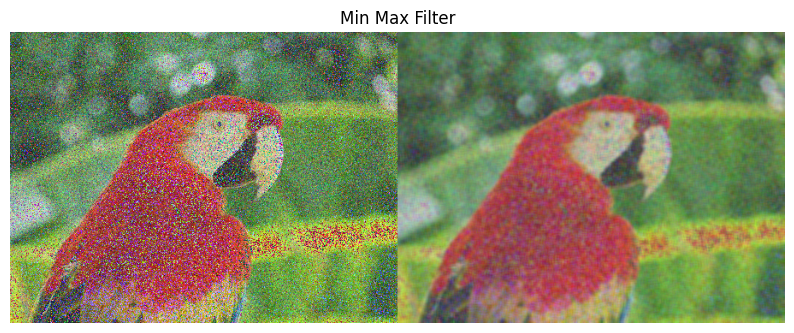

In [9]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread("./img/noisyParrot.png")
rgb_img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# creating kernel for the min-max filter of 5x5 
kernel = np.ones((5,5), dtype=np.uint8) / 25

# Applying the min-max filter
filtered_img = cv.filter2D(src=rgb_img, ddepth=-1, kernel=kernel)

plt.figure(figsize=(10,8))
plt.title("Min Max Filter")
res_img = np.hstack((rgb_img, filtered_img))
plt.imshow(res_img)
plt.axis("off")
plt.show()

**difference_opr.py**

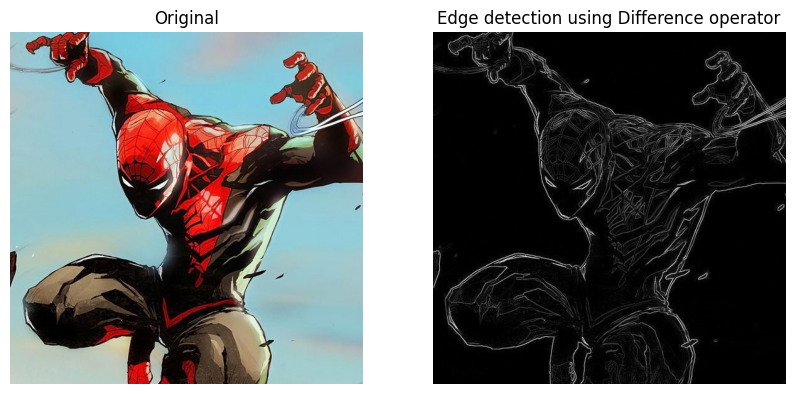

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/spidy.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# applying difference operator
gray_img = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
img_res = cv.subtract(gray_img, cv.erode(gray_img, None))

# diplay the result
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_res, cmap='gray')
plt.title("Edge detection using Difference operator")
plt.axis("off")

plt.show()

**robert_opr.py**

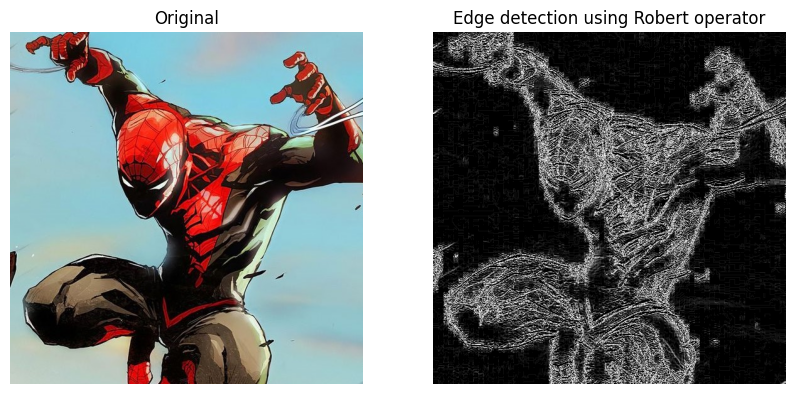

In [3]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/spidy.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# applying robert's operator
gray_img = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
robert_x = cv.filter2D(gray_img, -1, np.array([[1, 0], [0, -1]]))
robert_y = cv.filter2D(gray_img, -1, np.array([[0, 1], [-1, 0]]))
img_res = np.sqrt(robert_x**2 + robert_y**2).astype(np.uint8)

# diplay the result
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_res, cmap='gray')
plt.title("Edge detection using Robert operator")
plt.axis("off")

plt.show()

**prewitt_opr.py**

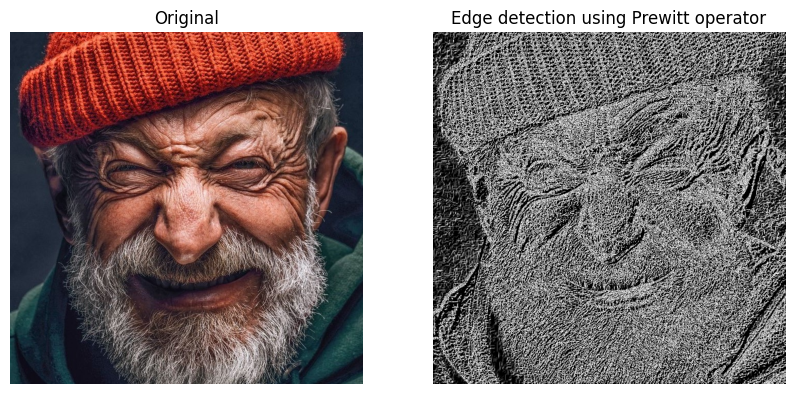

In [13]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/human-crop.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# applying robert's operator
gray_img = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
prewitt_x = cv.filter2D(gray_img, -1, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
prewitt_y = cv.filter2D(gray_img, -1, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))
img_res = np.sqrt(prewitt_x**2 + prewitt_y**2).astype(np.uint8)

# diplay the result
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_res, cmap='gray')
plt.title("Edge detection using Prewitt operator")
plt.axis("off")

plt.show()

**sobel_opr.py**

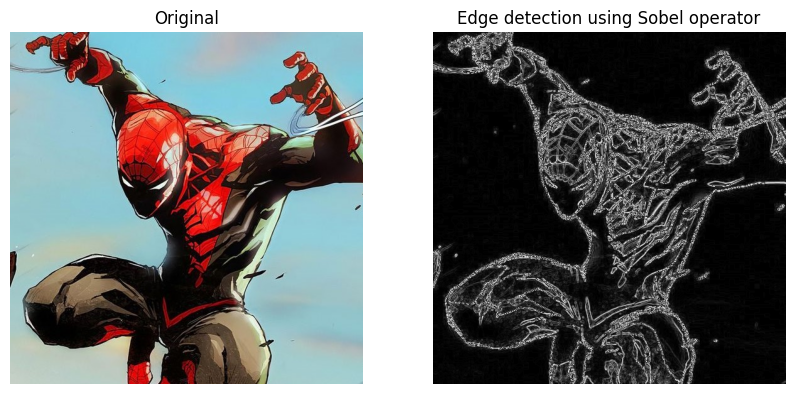

In [14]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv.imread("./img/spidy.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# applying robert's operator
gray_img = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
sobel_x = cv.Sobel(gray_img, cv.CV_64F, 1, 0, ksize=3)
sobel_y = cv.Sobel(gray_img, cv.CV_64F, 0, 1, ksize=3)
img_res = np.sqrt(sobel_x**2 + sobel_y**2).astype(np.uint8)


# diplay the result
plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_res, cmap='gray')
plt.title("Edge detection using Sobel operator")
plt.axis("off")

plt.show()

**two_way_merging.py**

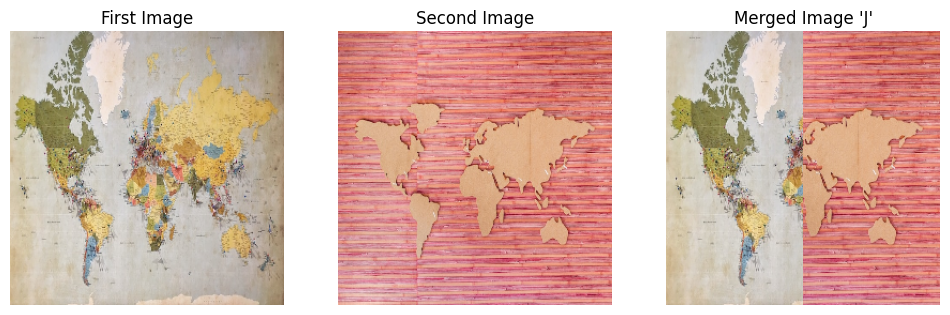

In [15]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# read the images
lena = cv.imread("./img/world_map_color.jpg")
peppers = cv.imread("./img/world_map_line.jpg")

# resizing images
lena = cv.cvtColor(cv.resize(lena, (256, 256)), cv.COLOR_BGR2RGB)
peppers = cv.cvtColor(cv.resize(peppers, (256, 256)), cv.COLOR_BGR2RGB)

# create a new empty canvas 'J' of 256 x 256 size
J = np.zeros((256, 256, 3), dtype=np.uint8)

# set the left half of 'J' to the left half of 'lena'
J[:, :128] = lena[:, :128]

# set the right half of 'J' to the right half of 'peppers'
J[:, 128:] = peppers[:, 128:]

# display the image 'J'
plt.figure(figsize=(12, 8))
plt.subplot(1,3,1)
plt.imshow(lena)
plt.title("First Image")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(peppers)
plt.title("Second Image")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(J)
plt.title("Merged Image 'J'")
plt.axis("off")

plt.show()